##Installation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -q https://github.com/pyannote/pyannote-audio/archive/develop.zip
!pip install -q speechbrain

     |████████████████████████████████| 13.6 MB 2.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 101 kB 5.6 MB/s 
     |████████████████████████████████| 79 kB 7.4 MB/s 
     |████████████████████████████████| 65 kB 3.3 MB/s 
     |████████████████████████████████| 41 kB 455 kB/s 
     |████████████████████████████████| 51 kB 142 kB/s 
     |████████████████████████████████| 585 kB 67.3 MB/s 
     |████████████████████████████████| 110 kB 69.5 MB/s 
     |████████████████████████████████| 419 kB 56.1 MB/s 
     |████████████████████████████████| 58 kB 5.4 MB/s 
     |████████████████████████████████| 596 kB 54.3 MB/s 
     |████████████████████████████████| 117 kB 74.8 MB/s 
     |████████████████████████████████| 130 kB 65.9 MB/s 
     |████████████████████████████████| 308 kB 64.0 MB/s 
     |████████████████████████████████| 81 kB 8.4 MB/s 
     |███████████

##Téléchargement des vidéos

On prendra ici une dizaine de vidéo sur lesquelles on appliquera la segmentation et clustering des locuteurs qu'offre PyAnnote. Les vidéos sont simplement importées depuis mon Drive (sauf la première qui sert d'exemple pour télécharger vos propres vidéos tout en offrant la possibilité d'écouter l'audio sur le notebook directement).

In [ ]:
import google.colab
from pyannote.core import Segment, notebook
from pyannote.audio import Audio 
from IPython.display import Audio as IPythonAudio

# video 1 : cepages-resistants
cepages_resistants, _ = google.colab.files.upload().popitem()
CEPAGES_RESISTANTS = {'audio': cepages_resistants}
notebook.reset()

# load audio waveform and play it
waveform, sample_rate = Audio()(CEPAGES_RESISTANTS)
IPythonAudio(data=waveform.squeeze(), rate=sample_rate, autoplay=True)

Saving cepages-resistants.wav to cepages-resistants.wav


###Téléchargement de votre vidéo

Pour télécharger et faire la diarization sur vos **propres vidéos**, vous n'avez qu'à lancer la dernière cellule de téléchargement, elle vous demandera de sélectionner un fichier audio .wav. Dirigez vous ensuite vers la dernière cellule de la section diarization qui correspond et exécutez la. (Bon après, c'est très long. Donc je vous conseille de simplement regarder les résultats ci-dessous).

In [ ]:
import google.colab
from pyannote.core import Segment, notebook
from pyannote.audio import Audio 
from IPython.display import Audio as IPythonAudio
own_file, _ = google.colab.files.upload().popitem()
OWN_FILE = {'audio': own_file}
notebook.reset()

# load audio waveform and play it
waveform, sample_rate = Audio()(OWN_FILE)
IPythonAudio(data=waveform.squeeze(), rate=sample_rate, autoplay=True)

##Diarization

C'est ici que l'on va jouer avec PyAnnote, et c'est qu'avec ces quelques lignes de code que l'on lance la segmentation et le clustering sur notre sélection de vidéos. Pour les vidéos très longues, cliquez-droit sur le graphe et ouvrez dans un autre onglet pour que ce soit plus lisible.

Si vous compilez avec vos propres fichiers, il se peut qu'il y ait un problème du pipeline, cette erreur en particulier:
```
TypeError: cached_download() takes 1 positional argument but 2 were given
```
Si c'est le cas, copiez et collez ces deux lignes au debut de la cellule suivante pour downgrade la version de huggingface utilisée:
```
!pip uninstall huggingface-hub
!pip install 'huggingface-hub==0.7.0'
```

Pour toute autre erreur, se référer aux [issues du github de PyAnnote audio](https://github.com/pyannote/pyannote-audio/issues) de Hervé BREDIN.

####Vidéo 1 : Cépages résistants

https://www.youtube.com/watch?v=P_uMFe1r37U

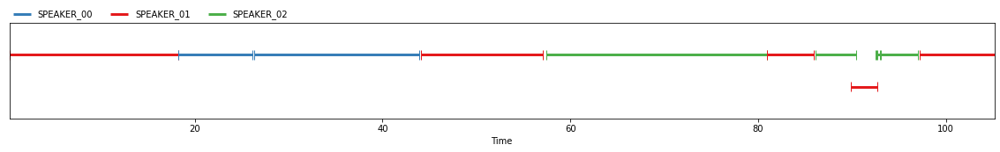

In [8]:
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# video 1 : cepages-resistants
diarization = pipeline(CEPAGES_RESISTANTS)
diarization

####Vidéo 2: Cours d'œnologie - Masterclass

https://www.youtube.com/watch?v=N3IQi_fVeXw&t=197s

Downloading:   0%|          | 0.00/489 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.98k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/83.3M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/5.53M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/129k [00:00<?, ?B/s]

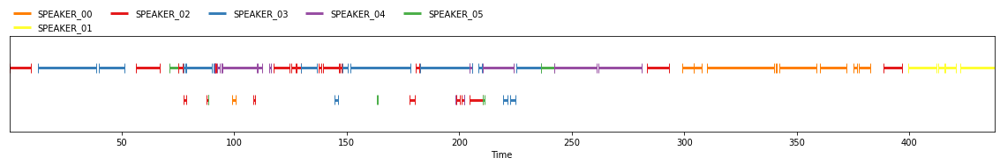

In [3]:
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# video 2 : cours-doenologie-masterclass
diarization_video3 = pipeline('/content/drive/MyDrive/TER_audios/cours-doenologie-masterclass.wav')

diarization_video3

Avec un petit zoom sur le moment intéressant entre 60s et 230s dans la vidéo, où de nombreux locuteurs discutent et se coupent la parole:

In [6]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 60s < t < 230s time range
EXCERPT = Segment(60, 230)
notebook.crop = EXCERPT

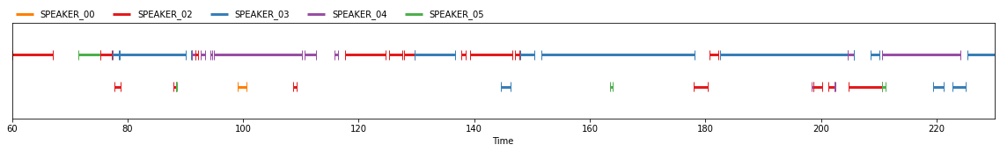

In [7]:
diarization_video3

####Vidéo 3: VITIS PROHIBITA EXTRAIT 4

https://www.youtube.com/watch?v=awKtlkpgG3c

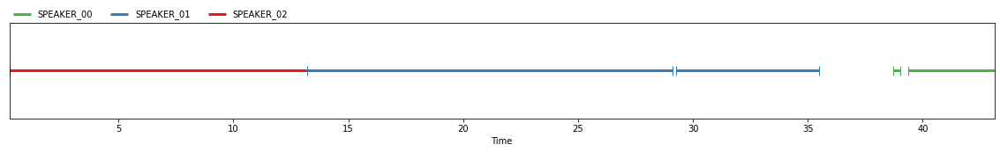

In [7]:
# video 3 : vitis-prohibita-extrait-4.wav
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

diarization = pipeline('/content/drive/MyDrive/TER_audios/vitis-prohibita-extrait-4.wav')
diarization

####Vidéo 4: VITIS PROHIBITA EXTRAIT 10

https://www.youtube.com/watch?v=uugl3ziO5M8

In [9]:
# video 4 : vitis-prohibita-extrait-10
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

diarization_video4 = pipeline('/content/drive/MyDrive/TER_audios/vitis-prohibita-extrait-10.wav')

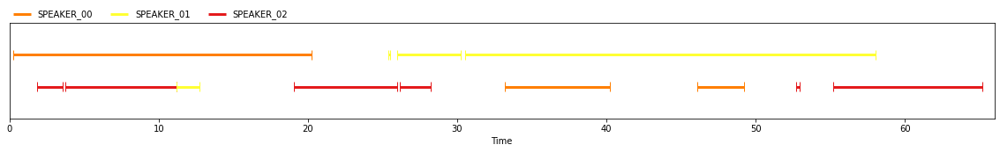

In [13]:
# make notebook visualization zoom on 0s < t < 66s time range
EXCERPT = Segment(0, 66)
notebook.crop = EXCERPT
diarization_video4

####Vidéo 5: Des vignes résistantes au mildiou avec l'INRA de Gruissan

https://www.youtube.com/watch?v=FK7UHhEKByw

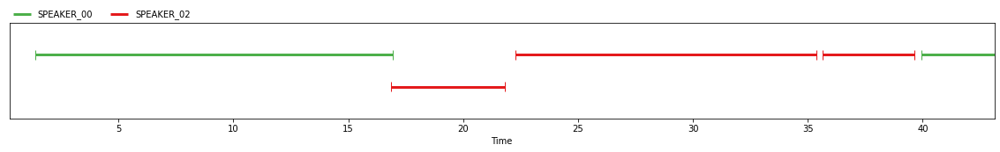

In [8]:
# video 5 : des-vignes-resistantes-au-mildiou-avec-linra-de-gruissan
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

diarization_video5 = pipeline('/content/drive/MyDrive/TER_audios/des-vignes-resistantes-au-mildiou-avec-linra-de-gruissan.wav')
diarization_video5

On fait ici un dezoom pour avoir toute la longueur de la vidéo (petite erreur d'échelle):

In [11]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 0s < t < 170s time range
EXCERPT = Segment(0, 170)
notebook.crop = EXCERPT

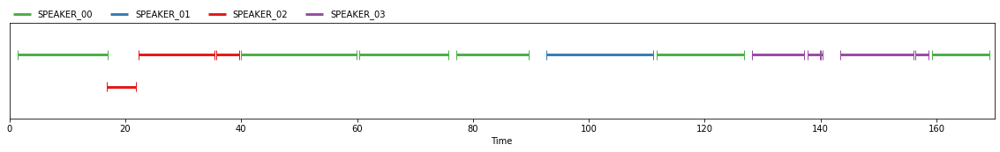

In [12]:
diarization_video5

####Vidéo 6: VITIS PROHIBITA EXTRAIT 13

https://www.youtube.com/watch?v=Erzn18X4LHg&t=1s

In [3]:
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# video 6 : vitis-prohibita-extrait-13
diarization_video6 = pipeline('/content/drive/MyDrive/TER_audios/vitis-prohibita-extrait-13.wav')

Downloading:   0%|          | 0.00/489 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.98k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/83.3M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/5.53M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/129k [00:00<?, ?B/s]

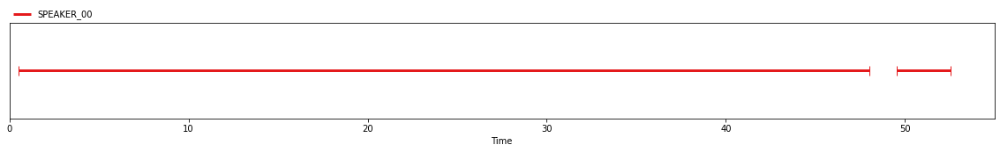

In [6]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 0s < t < 55s time range
EXCERPT = Segment(0, 55)
notebook.crop = EXCERPT
diarization_video6

####Vidéo 7: VITIS PROHIBITA EXTRAIT 15

https://www.youtube.com/watch?v=SN_b1k6MOKQ

In [7]:
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# video 7 : vitis-prohibita-extrait-15
diarization_video7 = pipeline('/content/drive/MyDrive/TER_audios/vitis-prohibita-extrait-15.wav')

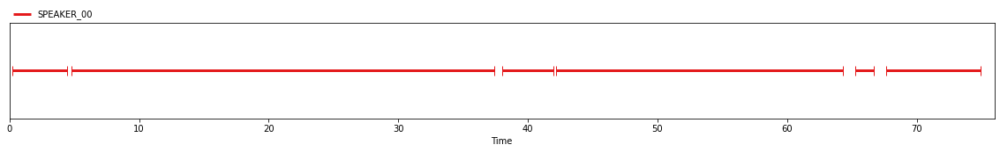

In [10]:
# make notebook visualization zoom on 0s < t < 76s time range
EXCERPT = Segment(0, 76)
notebook.crop = EXCERPT
diarization_video7

####Vidéo 8: Les variétés résistantes : évaluation sur le terrain

https://www.youtube.com/watch?v=hue6Md6-pdg&t=1s

In [3]:
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# video 8 : les-varietes-resistantes-evaluation-sur-le-terrain
diarization_video8 = pipeline('/content/drive/MyDrive/TER_audios/les-varietes-resistantes-evaluation-sur-le-terrain.wav')

Downloading:   0%|          | 0.00/489 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.98k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/83.3M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/5.53M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/129k [00:00<?, ?B/s]

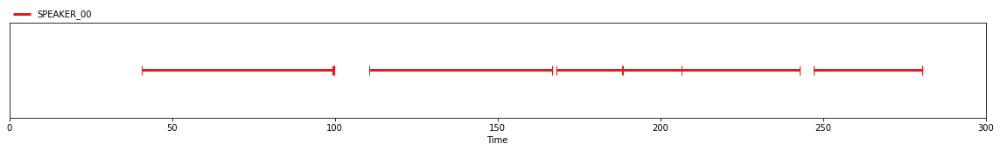

In [5]:
from pyannote.core import Segment, notebook
# make notebook visualization zoom on 0s < t < 300s time range
EXCERPT = Segment(0, 300)
notebook.crop = EXCERPT
diarization_video8

####Vidéos 9 et 10:

Celles là sont les plus longues (15 et 17 minutes) et prendront environ deux heures d'exécution je pense, du moins sur les serveurs de Google Colab comme en local sur ma machine. En plus de cela elles ne sont pas intéressante pour la diarization puisqu'une seule personne discute et dans de bonnes conditions d'enregistrement.

Laccave_séminaire_Idéoypes&Vins de demain_Eric Giraud-Héraud:

https://www.youtube.com/watch?v=2vv6sI1zX-8&t=1s

17- Colloque DEPHY Viticulture - Cépages résistants:

https://www.youtube.com/watch?v=eMRNIIASksU&t=1s

###Diarization de votre vidéo

In [ ]:
from pyannote.audio import Pipeline
pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization')

# Votre video
diarization_own_file = pipeline(OWN_FILE)
diarization_own_file

Tout ce qui a été fourni dans de ce notebook se base sur le travail de Hervé BREDIN de l'équipe SAMoVA de l'IRIT. Tout copyright autour de PyAnnote lui revient de droit et se basent spécifiquement sur la partie audio de [son git](https://github.com/pyannote/pyannote-audio).